### Read Data and Importing Libraries ###

#### Import Library ####

In [ ]:
# Libraries for data handling and processing
import numpy as np
import pandas as pd
import os
import pathlib

# Libraries for image processing
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# TensorFlow and Keras related imports
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.applications import VGG16

# Sklearn for evaluation
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize


#### Define Training, Validation, and Test Dataset Path ####

In [57]:
from pathlib import Path

# Tentukan direktori pelatihan
train_dir = Path('datasets/train')

# Mengambil nama folder dalam direktori pelatihan
folder_names = [folder.name for folder in train_dir.iterdir() if folder.is_dir()]

print(folder_names)


['apple', 'banana', 'Bean', 'beetroot', 'bell pepper', 'Brinjal', 'cabbage', 'capsicum', 'carrot', 'cauliflower', 'chilli pepper', 'corn', 'cucumber', 'eggplant', 'garlic', 'ginger', 'grapes', 'jalepeno', 'kiwi', 'lemon', 'lettuce', 'mango', 'onion', 'orange', 'Papaya', 'paprika', 'pear', 'peas', 'pineapple', 'pomegranate', 'potato', 'Pumpkin', 'raddish', 'soy beans', 'spinach', 'strawberry', 'sweetcorn', 'sweetpotato', 'tomato', 'turnip', 'watermelon']


In [58]:

val_dir = os.path.join('datasets/validation')
test_dir = os.path.join('datasets/test')


#### Training, Validation and Test Datagen Generator ####

In [59]:

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

categories = ['capsicum', 'sweetcorn', 'orange', 'tomato', 'turnip', 'ginger', 'raddish', 'pomegranate', 'pineapple', 'jalepeno', 'apple', 'carrot', 'lettuce', 'bell pepper', 'eggplant', 'beetroot', 'kiwi', 'pear', 'cabbage', 'cauliflower', 'paprika', 'lemon', 'sweetpotato', 'grapes', 'cucumber', 'corn', 'banana', 'garlic', 'chilli pepper', 'watermelon', 'mango', 'peas', 'onion', 'potato', 'spinach', 'soy beans']

# Create data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=64,
    class_mode='categorical',
    classes=categories
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    batch_size=64,
    class_mode='categorical',
    classes=categories
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=64,
    class_mode='categorical',
    classes=categories
)

Found 3261 images belonging to 36 classes.
Found 351 images belonging to 36 classes.
Found 359 images belonging to 36 classes.


/home/josgiv/intelpython3/lib/python3.12/site-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


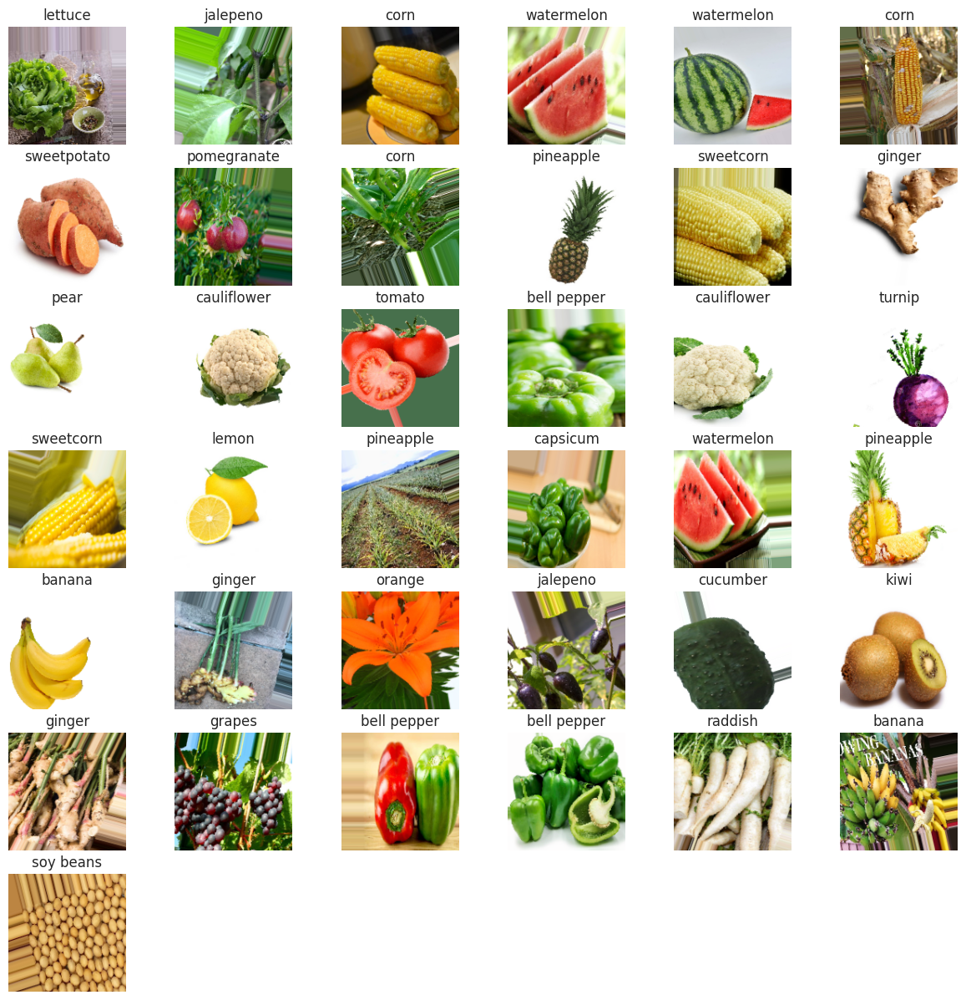

In [60]:
images, labels = next(train_generator)
class_names = list(train_generator.class_indices.keys())

plt.figure(figsize=(15, 15))

for i in range(37):
    ax = plt.subplot(7, 6, i + 1)  # 7 rows, 6 columns grid
    plt.imshow(images[i])
    plt.title(class_names[labels[i].argmax()])
    plt.axis("off")

plt.show()

## Exploratory Data Analysis ##

#### Distribusi Ukuran Gambar ####

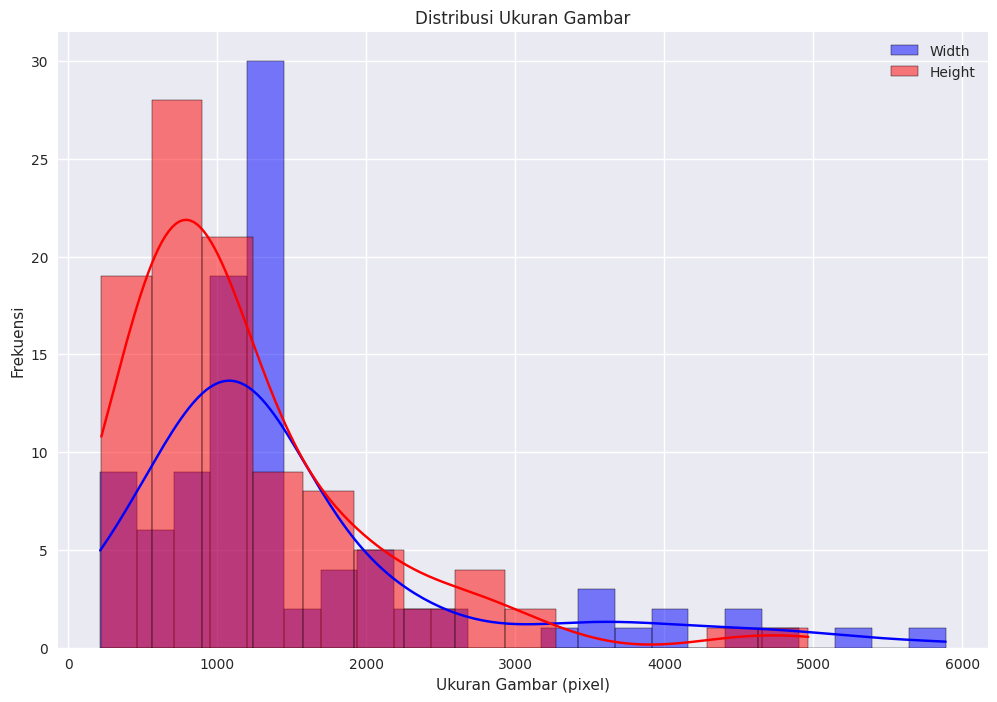

In [ ]:
image_sizes = []

# Loop melalui beberapa gambar untuk mendapatkan ukuran
sample_images = list(train_dir.glob('*/*.jpg'))[:100]  # Ambil 100 gambar contoh dari train_dir
for image_path in sample_images:
    with Image.open(image_path) as img:
        image_sizes.append(img.size)

# Convert ke dataframe untuk analisis
image_sizes_df = pd.DataFrame(image_sizes, columns=['Width', 'Height'])

# Visualisasi distribusi ukuran gambar
plt.figure(figsize=(12, 8))
sns.histplot(image_sizes_df['Width'], kde=True, color='blue', label='Width')
sns.histplot(image_sizes_df['Height'], kde=True, color='red', label='Height')
plt.xlabel('Ukuran Gambar (pixel)')
plt.ylabel('Frekuensi')
plt.title('Distribusi Ukuran Gambar')
plt.legend()
plt.show()


In [63]:
# Konversi string path menjadi objek Path
train_dir = Path(train_dir)  # Pastikan ini adalah path yang benar
val_dir = Path(val_dir)      # Pastikan ini adalah path yang benar
test_dir = Path(test_dir)    # Pastikan ini adalah path yang benar

# Menyimpan ukuran gambar
image_shape = []

# Memeriksa hanya 10 gambar per folder (kelas)
for folder in train_dir.iterdir():
    if folder.is_dir():
        count = 0
        for image_path in folder.glob('*.jpg'):
            if count >= 10:  # Hanya ambil 10 gambar per kelas
                break
            with Image.open(image_path) as img:
                image_shape.append(img.size)
                count += 1

# Menampilkan statistik gambar
image_shape_df = pd.DataFrame(image_shape, columns=['Width', 'Height'])
print(image_shape_df.describe())

# Visualisasi jumlah gambar di train, validation, dan test set
train_count = sum([len(list(folder.glob('*'))) for folder in train_dir.iterdir() if folder.is_dir()])
val_count = sum([len(list(folder.glob('*'))) for folder in val_dir.iterdir() if folder.is_dir()])
test_count = sum([len(list(folder.glob('*'))) for folder in test_dir.iterdir() if folder.is_dir()])

print(f"\n")
print(f'Jumlah gambar di Train Set: {train_count}')
print(f'Jumlah gambar di Validation Set: {val_count}')
print(f'Jumlah gambar di Test Set: {test_count}')

             Width       Height
count   410.000000   410.000000
mean   1367.997561  1130.185366
std    1018.366688   859.968416
min     224.000000   199.000000
25%     800.000000   638.500000
50%    1200.000000   942.000000
75%    1600.000000  1300.000000
max    6183.000000  6351.000000


Jumlah gambar di Train Set: 3815
Jumlah gambar di Validation Set: 1156
Jumlah gambar di Test Set: 1170


#### Checking for corrupt image ####

In [ ]:
# Cek Kualitas Data: Periksa Gambar Rusak (Corrupt Image Files)
def check_image_integrity(image_paths):
    corrupt_images = []
    for image_path in image_paths:
        try:
            with Image.open(image_path) as img:
                img.verify()  # Verifikasi integritas gambar
        except (IOError, SyntaxError) as e:
            corrupt_images.append(image_path)
    return corrupt_images

all_image_paths = list(train_dir.glob('**/*.jpg'))
corrupt_images = check_image_integrity(all_image_paths)
print(f"Jumlah gambar rusak: {len(corrupt_images)}")
if corrupt_images:
    print(f"Beberapa gambar rusak: {corrupt_images[:5]}")



Jumlah gambar rusak: 0


## Modelling ##

### Check Active GPU ###

In [71]:
!nvidia-smi

Fri Nov 29 01:52:07 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.127.05             Driver Version: 566.14         CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 2050        On  |   00000000:01:00.0 Off |                  N/A |
| N/A   49C    P8              3W /   55W |    3706MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras import mixed_precision

# Enable mixed precision for better GPU performance
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

# Function to create VGG16 model
def create_vgg16_model(input_shape, num_classes):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Freezing the base model layers
    
    model = Sequential([
        base_model,
        Flatten(),
        Dense(1024, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

# Parameters
input_shape = (150, 150, 3)
num_classes = 41  # Update to match the number of classes in your dataset

# Model Creation
model_vgg16 = create_vgg16_model(input_shape, num_classes)

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
tensorboard = TensorBoard(log_dir='logs', histogram_freq=1)

# ImageDataGenerator with Augmentation for faster and efficient training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Assuming you have already set up your data generators
train_generator = train_datagen.flow_from_directory(
    'datasets/train',
    target_size=(150, 150),
    batch_size=64,  # Increased batch size for better GPU utilization
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    'datasets/test',
    target_size=(150, 150),
    batch_size=64,  # Same batch size for validation
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    'datasets/test',
    target_size=(150, 150),
    batch_size=64,  # Same batch size for testing
    class_mode='categorical'
)

# Check if TensorFlow is using the GPU
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


Found 3815 images belonging to 41 classes.
Found 1170 images belonging to 41 classes.
Found 1170 images belonging to 41 classes.
Num GPUs Available:  1
Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.0743 - loss: 3.8150

2024-11-29 01:59:11.285050: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_231', 12 bytes spill stores, 12 bytes spill loads

2024-11-29 01:59:11.500516: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_238', 108 bytes spill stores, 108 bytes spill loads

2024-11-29 01:59:11.635759: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_238', 72 bytes spill stores, 72 bytes spill loads



59/59 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - accuracy: 0.0752 - loss: 3.8093 - val_accuracy: 0.5807 - val_loss: 2.2247 - learning_rate: 1.0000e-04
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - accuracy: 0.3281 - loss: 2.7307

/home/josgiv/intelpython3/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 16s 271ms/step - accuracy: 0.3281 - loss: 2.7307 - val_accuracy: 0.5764 - val_loss: 2.2096 - learning_rate: 1.0000e-04
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 86s 1s/step - accuracy: 0.2975 - loss: 2.7461 - val_accuracy: 0.7257 - val_loss: 1.3935 - learning_rate: 1.0000e-04
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step - accuracy: 0.2656 - loss: 2.5444 - val_accuracy: 0.7274 - val_loss: 1.3844 - learning_rate: 1.0000e-04
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 86s 1s/step - accuracy: 0.3906 - loss: 2.3192 - val_accuracy: 0.7821 - val_loss: 1.1294 - learning_rate: 1.0000e-04
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 13s 224ms/step - accuracy: 0.3906 - loss: 2.1740 - val_accuracy: 0.7865 - val_loss: 1.1191 - learning_rate: 1.0000e-04
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - accuracy: 0.4462 - loss: 2.0349 - val_accuracy: 0.8082 - val_loss: 0.9317 - learning_rate: 1.0000e-04
Epoch 8/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 14s 234ms/step - accuracy: 0.5156 - loss

#### Train model ####

In [ ]:
# Train the model
history_vgg16 = model_vgg16.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator,
    callbacks=[early_stopping, reduce_lr, tensorboard],
    steps_per_epoch=train_generator.samples // train_generator.batch_size,  # This makes sure steps per epoch is correct
    validation_steps=val_generator.samples // val_generator.batch_size  # Adjust this as well for validation
)


## Evaluation ##

18/19 ━━━━━━━━━━━━━━━━━━━━ 0s 686ms/step - accuracy: 0.9180 - loss: 0.3562

2024-11-29 06:39:48.374407: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_231', 40 bytes spill stores, 40 bytes spill loads

2024-11-29 06:39:49.179109: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_238', 16 bytes spill stores, 16 bytes spill loads

2024-11-29 06:39:49.217151: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_238', 156 bytes spill stores, 140 bytes spill loads

2024-11-29 06:39:49.263980: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_238', 120 bytes spill stores, 120 bytes spill loads



19/19 ━━━━━━━━━━━━━━━━━━━━ 17s 863ms/step - accuracy: 0.9184 - loss: 0.3560
Test accuracy for VGG16: 92.22%


2024-11-29 06:39:54.026151: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


19/19 ━━━━━━━━━━━━━━━━━━━━ 12s 570ms/step
Test Loss: 0.35416120290756226
Test Accuracy: 0.9222221970558167
ROC AUC Score: 0.5002693063863293
Classification Report:
               precision    recall  f1-score      support
0              0.166667  0.160000  0.163265   200.000000
1              0.179191  0.155000  0.166220   200.000000
2              0.148515  0.150000  0.149254   200.000000
3              0.171123  0.160000  0.165375   200.000000
4              0.000000  0.000000  0.000000    10.000000
5              0.000000  0.000000  0.000000     9.000000
6              0.111111  0.100000  0.105263    10.000000
7              0.000000  0.000000  0.000000    10.000000
8              0.058824  0.100000  0.074074    10.000000
9              0.000000  0.000000  0.000000    10.000000
10             0.000000  0.000000  0.000000    10.000000
11             0.000000  0.000000  0.000000    10.000000
12             0.000000  0.000000  0.000000    10.000000
13             0.000000  0.000000  0.

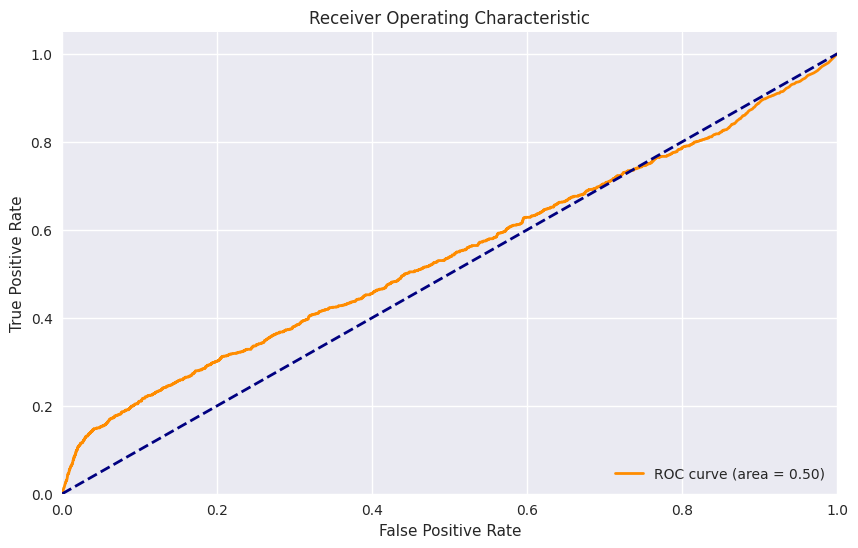

In [78]:

# Evaluate model
test_loss_vgg16, test_acc_vgg16 = model_vgg16.evaluate(test_generator)
print(f"Test accuracy for VGG16: {test_acc_vgg16 * 100:.2f}%")

# Prediction on the test set
y_true = test_generator.classes
y_pred = model_vgg16.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

# Classification Metrics
class_report = classification_report(y_true, y_pred_classes, output_dict=True)
df_class_report = pd.DataFrame(class_report).transpose()

# ROC & AUC
y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))
roc_auc = roc_auc_score(y_true_bin, y_pred, multi_class='ovr')

fpr, tpr, _ = roc_curve(y_true_bin.ravel(), y_pred.ravel())

# Results in a structured variable
metrics = {
    "test_loss": test_loss_vgg16,
    "test_accuracy": test_acc_vgg16,
    "classification_report": df_class_report,
    "roc_auc": roc_auc,
    "fpr": fpr,
    "tpr": tpr
}

# Display Results
print("Test Loss:", metrics["test_loss"])
print("Test Accuracy:", metrics["test_accuracy"])
print("ROC AUC Score:", metrics["roc_auc"])
print("Classification Report:\n", metrics["classification_report"])

# Plot ROC Curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % metrics["roc_auc"])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


2024-11-29 06:40:07.256794: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_208', 108 bytes spill stores, 108 bytes spill loads

2024-11-29 06:40:07.343412: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_208', 72 bytes spill stores, 72 bytes spill loads



2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step


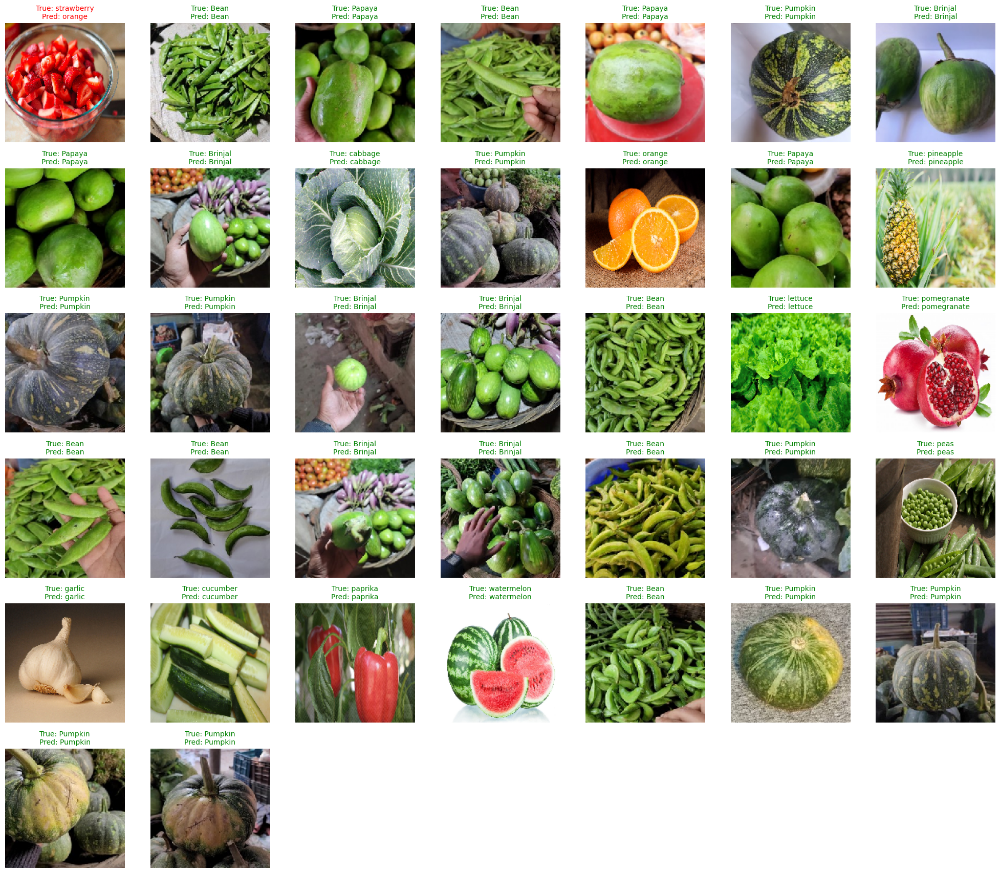

In [79]:
def plot_predictions(generator, model, num_images=37):
    # Get a batch of images and true labels from the generator
    images, true_labels = next(generator)

    # Predict the labels for these images
    predictions = model.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    true_labels = np.argmax(true_labels, axis=1)

    # Class names
    class_names = list(generator.class_indices.keys())

    # Plot the images
    plt.figure(figsize=(20, 20))
    grid_size = int(np.ceil(np.sqrt(num_images)))  # Adjust grid size for better layout

    for i in range(num_images):
        ax = plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(images[i])
        
        # Titles with different colors for correct/incorrect predictions
        if predicted_labels[i] == true_labels[i]:
            color = 'green'
        else:
            color = 'red'
        
        plt.title(f"True: {class_names[true_labels[i]]}\nPred: {class_names[predicted_labels[i]]}",
                  color=color, fontsize=10)
        plt.axis("off")

    plt.tight_layout()  # Adjust spacing between plots
    plt.show()

# Example usage
plot_predictions(test_generator, model_vgg16)

In [82]:
test_loss_vgg16, test_acc_vgg16 = model_vgg16.evaluate(test_generator)
print(f"Test accuracy for VGG16: {test_acc_vgg16 * 100:.2f}%")

19/19 ━━━━━━━━━━━━━━━━━━━━ 14s 702ms/step - accuracy: 0.9275 - loss: 0.3567
Test accuracy for VGG16: 92.22%


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step


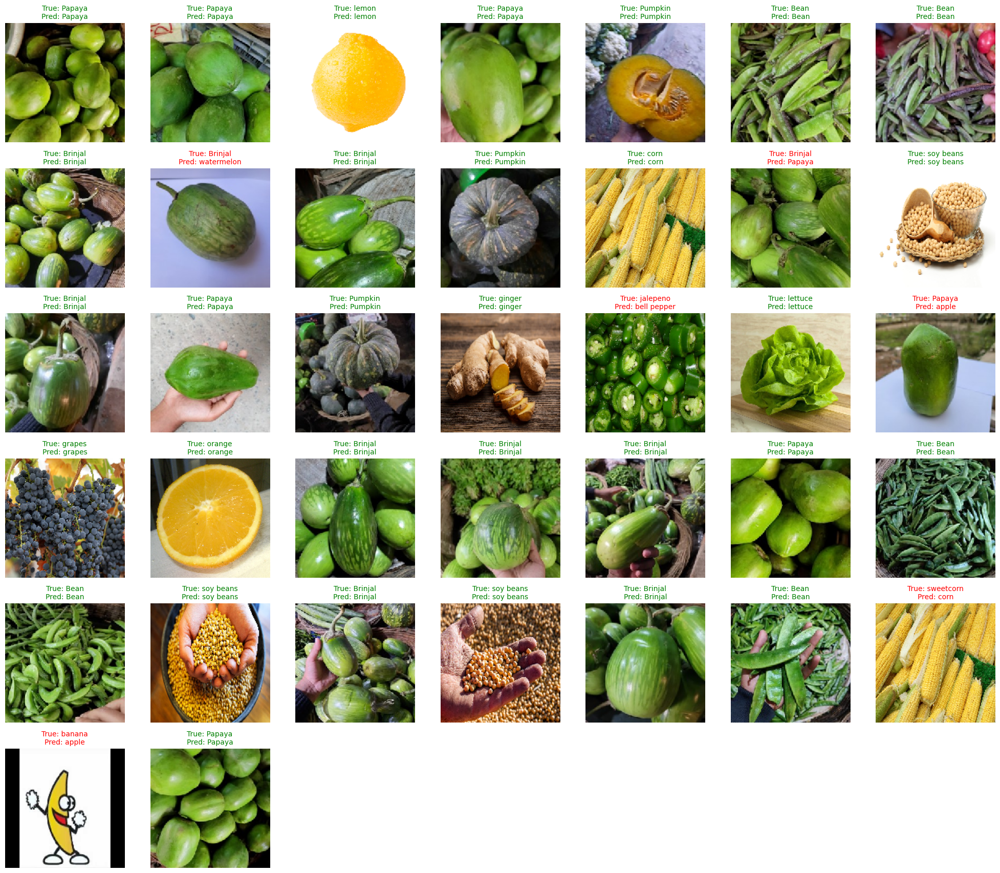

In [83]:
def plot_predictions(generator, model, num_images=37):
    images, true_labels = next(generator)

    predictions = model.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    true_labels = np.argmax(true_labels, axis=1)

    class_names = list(generator.class_indices.keys())

    plt.figure(figsize=(20, 20))
    grid_size = int(np.ceil(np.sqrt(num_images)))

    for i in range(num_images):
        ax = plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(images[i])
        
        if predicted_labels[i] == true_labels[i]:
            color = 'green'
        else:
            color = 'red'
        
        plt.title(f"True: {class_names[true_labels[i]]}\nPred: {class_names[predicted_labels[i]]}",
                  color=color, fontsize=10)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

plot_predictions(test_generator, model_vgg16)

## Dump Model ##

In [ ]:
import os

# Pastikan direktori output ada
output_dir = "../models"
os.makedirs(output_dir, exist_ok=True)

# Sub-folder untuk setiap format
h5_dir = os.path.join(output_dir, "HDF5")
saved_model_dir = os.path.join(output_dir, "SavedModel")

# Membuat folder jika belum ada
for folder in [h5_dir, saved_model_dir]:
    os.makedirs(folder, exist_ok=True)

# 1. Simpan model ke format HDF5
h5_path = os.path.join(h5_dir, "model_vgg16.h5")
model_vgg16.save(h5_path)
print(f"Model saved to HDF5 format at {h5_path}")


Model saved to HDF5 format at model_dumps/HDF5/model_vgg16.h5


In [129]:
# 3. Save to TensorFlow Lite format (mobile compatible)
tflite_dir = os.path.join(output_dir, "TFLite")
os.makedirs(tflite_dir, exist_ok=True)

# Convert the model to TensorFlow Lite format (with FlexOps enabled)
converter = tf.lite.TFLiteConverter.from_keras_model(model_vgg16)
converter.target_spec.supported_ops = [tf.lite.OpsSet.SELECT_TF_OPS]
tflite_model = converter.convert()

# Save the converted model
tflite_path = os.path.join(tflite_dir, "model_vgg16_with_flex.tflite")
with open(tflite_path, "wb") as f:
    f.write(tflite_model)
print(f"Model saved to TensorFlow Lite format with FlexOps at {tflite_path}")




Saved artifact at '/tmp/tmp9x75z_0j'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float16, name='keras_tensor_189')
Output Type:
  TensorSpec(shape=(None, 41), dtype=tf.float16, name=None)
Captures:
  140427304818960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304821072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304821264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304821840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304822032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304822608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304822800: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304823376: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304823568: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304824144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304

W0000 00:00:1732855049.731342    5255 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1732855049.731424    5255 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
2024-11-29 11:37:29.731682: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: /tmp/tmp9x75z_0j
2024-11-29 11:37:29.732635: I tensorflow/cc/saved_model/reader.cc:52] Reading meta graph with tags { serve }
2024-11-29 11:37:29.732653: I tensorflow/cc/saved_model/reader.cc:147] Reading SavedModel debug info (if present) from: /tmp/tmp9x75z_0j
2024-11-29 11:37:29.746024: I tensorflow/cc/saved_model/loader.cc:236] Restoring SavedModel bundle.
2024-11-29 11:37:29.917533: I tensorflow/cc/saved_model/loader.cc:220] Running initialization op on SavedModel bundle at path: /tmp/tmp9x75z_0j
2024-11-29 11:37:29.941863: I tensorflow/cc/saved_model/loader.cc:466] SavedModel load for tags { serve }; Status: success: OK. Took 210193 microseconds.
2024-11-29 11:37:31.048649: W tensorflow/com

Model saved to TensorFlow Lite format with FlexOps at model_dumps/TFLite/model_vgg16_with_flex.tflite


In [130]:
import tensorflow as tf
import os

# Konversi model ke format TensorFlow Lite dengan optimasi quantization dan Flex ops
converter = tf.lite.TFLiteConverter.from_keras_model(model_vgg16)

# Aktifkan Flex ops untuk operasi yang tidak didukung secara default
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,         # Operasi bawaan TensorFlow Lite
    tf.lite.OpsSet.SELECT_TF_OPS           # Menyertakan Flex ops untuk mendukung operasi TensorFlow standar
]

# Optimasi untuk quantization (opsional, sesuaikan jika diperlukan)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

# Lakukan konversi
try:
    tflite_model = converter.convert()
    
    # Simpan model yang telah dikonversi
    tflite_path = os.path.join(tflite_dir, "model_vgg16_quantized.tflite")
    with open(tflite_path, "wb") as f:
        f.write(tflite_model)
    
    print(f"Model disimpan ke format TensorFlow Lite dengan quantization di {tflite_path}")
except Exception as e:
    print(f"Terjadi kesalahan saat mengonversi model: {e}")


Saved artifact at '/tmp/tmptws4z01s'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float16, name='keras_tensor_189')
Output Type:
  TensorSpec(shape=(None, 41), dtype=tf.float16, name=None)
Captures:
  140427304818960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304821072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304821264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304821840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304822032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304822608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304822800: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304823376: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304823568: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304824144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140427304

W0000 00:00:1732855053.124665    5255 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1732855053.124741    5255 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
2024-11-29 11:37:33.124962: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: /tmp/tmptws4z01s
2024-11-29 11:37:33.126231: I tensorflow/cc/saved_model/reader.cc:52] Reading meta graph with tags { serve }
2024-11-29 11:37:33.126253: I tensorflow/cc/saved_model/reader.cc:147] Reading SavedModel debug info (if present) from: /tmp/tmptws4z01s
2024-11-29 11:37:33.140887: I tensorflow/cc/saved_model/loader.cc:236] Restoring SavedModel bundle.
2024-11-29 11:37:33.292006: I tensorflow/cc/saved_model/loader.cc:220] Running initialization op on SavedModel bundle at path: /tmp/tmptws4z01s
2024-11-29 11:37:33.310151: I tensorflow/cc/saved_model/loader.cc:466] SavedModel load for tags { serve }; Status: success: OK. Took 185192 microseconds.
2024-11-29 11:37:34.450808: W tensorflow/com

Model disimpan ke format TensorFlow Lite dengan quantization di model_dumps/TFLite/model_vgg16_quantized.tflite


### Real Case Scenario 

In [ ]:
import os
import tkinter as tk
from tkinter import filedialog
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
from tensorflow.keras import layers
from tensorflow.keras.utils import get_custom_objects

# Register custom functions or layers
def my_function(x):
    return x * 2  # Example custom function

get_custom_objects()['my_function'] = my_function

# Load the model with custom objects
model_vgg16 = load_model('model_dumps/HDF5/model_vgg16.h5')
print(f"Model loaded successfully")

# Function to select an image
def choose_image():
    root = tk.Tk()
    root.withdraw()
    file_path = filedialog.askopenfilename(title="Select an Image", filetypes=[("Image files", "*.jpg;*.jpeg;*.png")])
    return file_path

# Function to classify the image
def classify_image(image_path):
    img = Image.open(image_path)
    img = img.resize((224, 224))
    img_array = np.array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0

    predictions = model_vgg16.predict(img_array)
    predicted_class = np.argmax(predictions, axis=1)

    return predicted_class, predictions

# Main program
if __name__ == "__main__":
    image_path = choose_image()
    if image_path:
        print(f"Selected Image: {image_path}")
        predicted_class, predictions = classify_image(image_path)
        print(f"Predicted Class: {predicted_class}")
        print(f"Predictions: {predictions}")
    else:
        print("No image selected.")


KeyError: 'function'